In [1]:
import numpy as np #linear algebra module
import pandas as pd #data processing module
import matplotlib.pyplot as plt #to draw anything
import seaborn as sns #to draw anything

%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn import metrics
from mord import LogisticAT
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error


tb=pd.read_csv("lasvegas.csv")

In [2]:
tb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 504 entries, 0 to 503
Data columns (total 20 columns):
User country         504 non-null object
Nr. reviews          504 non-null int64
Nr. hotel reviews    504 non-null int64
Helpful votes        504 non-null int64
Score                504 non-null int64
Period of stay       504 non-null object
Traveler type        504 non-null object
Pool                 504 non-null int64
Gym                  504 non-null int64
Tennis court         504 non-null int64
Spa                  504 non-null int64
Casino               504 non-null int64
Free internet        504 non-null int64
Hotel name           504 non-null object
Hotel stars          504 non-null float64
Nr. rooms            504 non-null int64
User continent       504 non-null object
Member years         504 non-null int64
Review month         504 non-null object
Review weekday       504 non-null object
dtypes: float64(1), int64(12), object(7)
memory usage: 78.8+ KB


In [3]:
tb.isna().sum() #empty fields checking

User country         0
Nr. reviews          0
Nr. hotel reviews    0
Helpful votes        0
Score                0
Period of stay       0
Traveler type        0
Pool                 0
Gym                  0
Tennis court         0
Spa                  0
Casino               0
Free internet        0
Hotel name           0
Hotel stars          0
Nr. rooms            0
User continent       0
Member years         0
Review month         0
Review weekday       0
dtype: int64

In [4]:
countries=tb.groupby('User country')[['Score']].count() #let's see how many reviews from each country we got
countries=countries.sort_values(by='Score',ascending=False)#and sort them ofc
countries

#as we can see the majority of the guests is from english-speaking countries

,Score
User country,
USA,217
UK,72
Canada,65
Australia,36
Ireland,13
India,11
Mexico,8
Germany,7
Brazil,5


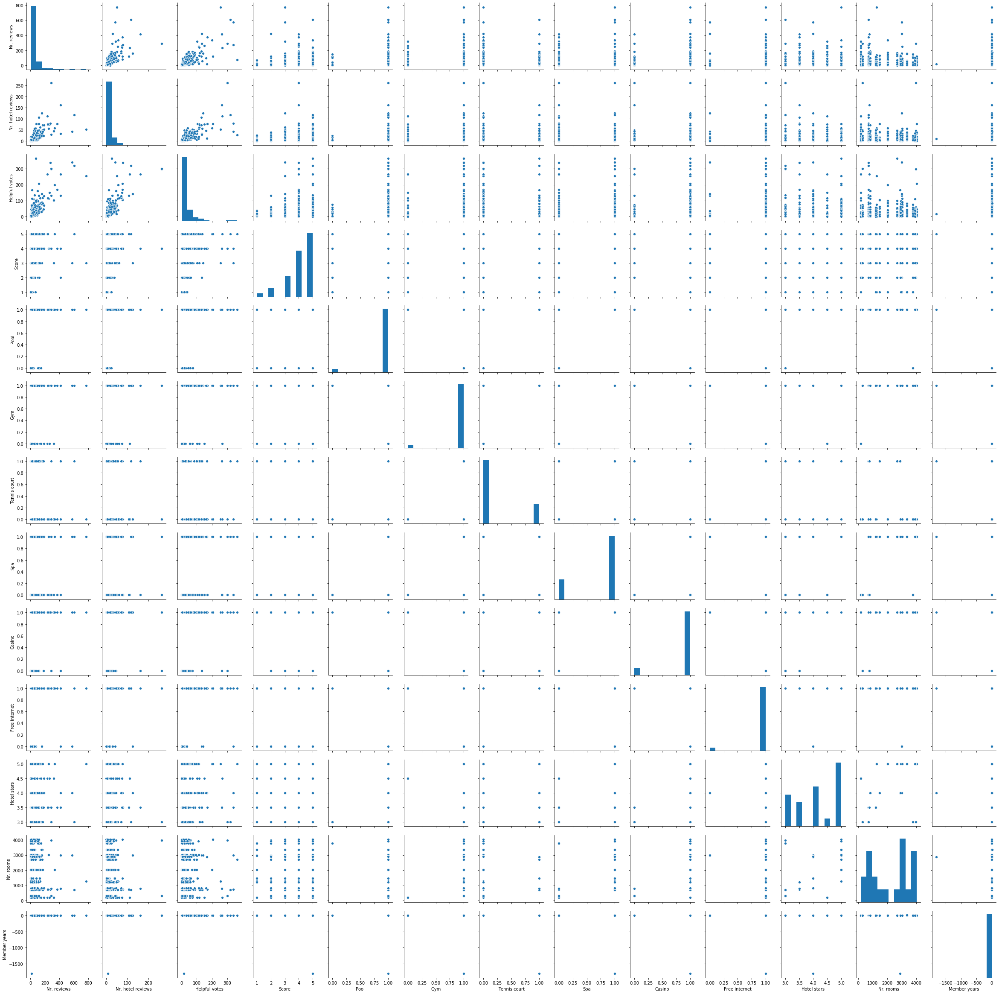

In [6]:
sns.pairplot(tb)

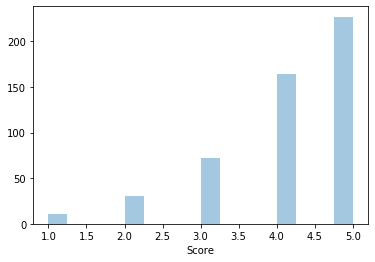

In [7]:
sns.distplot(tb['Score'],kde=False)

In [8]:
tb.columns

Index(['User country', 'Nr. reviews', 'Nr. hotel reviews', 'Helpful votes',
       'Score', 'Period of stay', 'Traveler type', 'Pool', 'Gym',
       'Tennis court', 'Spa', 'Casino', 'Free internet', 'Hotel name',
       'Hotel stars', 'Nr. rooms', 'User continent', 'Member years',
       'Review month', 'Review weekday'],
      dtype='object')

In [5]:
#here I will try to predict how hotel stars and number of rooms can reflect to the score

X=tb[['Hotel stars', 'Nr. rooms','Nr. reviews', 'Nr. hotel reviews', 'Helpful votes']]

y=tb[['Score']]

In [6]:
corr = pd.DataFrame(data=tb, columns=['Hotel stars', 'Nr. rooms','Nr. reviews', 'Nr. hotel reviews', 'Helpful votes','Score'])

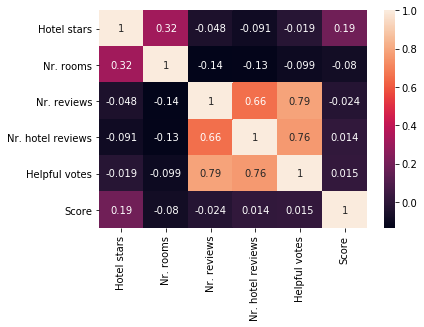

In [7]:
#As we can see y values do not correlate much vith X datapoints, the biggest dependence is with 'Hotel stars' values 
#this only explains that number of reviews increases chances to be helpful to other users
sns.heatmap(corr.corr(),annot=True)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.8, random_state = 101)

In [60]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [61]:
prediction = lm.predict(X_test)

{'whiskers': [<matplotlib.lines.Line2D at 0x1a2a46c748>,
 'caps': [<matplotlib.lines.Line2D at 0x1a2a46ce80>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a2a46c400>],
 'medians': [<matplotlib.lines.Line2D at 0x1a2a45ecc0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a2a478828>],
 'means': []}

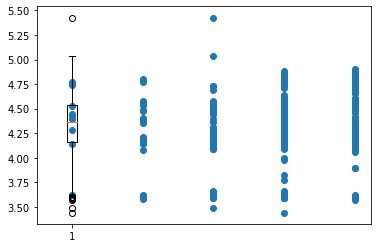

In [62]:
plt.scatter(y_test,prediction)
plt.boxplot(prediction)
#plt.boxplot(y_test)

In [63]:
print('RMSE = ', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

RMSE =  1.0405217781651563


In [9]:
#lets try another type of regression and compare it to the linear one

model_linear = LinearRegression()
model_1vR = LogisticRegression(multi_class='ovr', class_weight='balanced')
model_multi = LogisticRegression(multi_class='multinomial', solver='lbfgs', class_weight='balanced')
model_ordinal = LogisticAT(alpha=0) 


In [10]:
features = tb[['Nr. reviews', 'Nr. hotel reviews', 'Helpful votes', 'Pool', 'Gym',
       'Tennis court', 'Spa', 'Casino', 'Free internet',
       'Hotel stars', 'Nr. rooms',  'Member years']]  #all except scores
target = tb[['Score']]

MAE = make_scorer(mean_absolute_error)
folds=5

MAE_linear = cross_val_score(model_linear,
    features,
    target,
    cv=folds,
    scoring=MAE)

MAE_1vR = cross_val_score(model_1vR,
    features,
    target,
    cv=folds,
    scoring=MAE)

MAE_multi = cross_val_score(model_multi,
    features,
    target,
    cv=folds,
    scoring=MAE)


/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/vitalij/ana

In [11]:
print('Mean absolute error:' )
print('Linear regression: ', np.mean(MAE_linear))
print('Logistic regression (one versus rest): ', np.mean(MAE_1vR))
print('Logistic regression (multinomial): ', np.mean(MAE_multi))

Mean absolute error:
Linear regression:  0.8279536155237134
Logistic regression (one versus rest):  1.2687853405557574
Logistic regression (multinomial):  1.8138323036187114


In [12]:
from sklearn.metrics import accuracy_score

def acc_fun(target_true, target_fit):
    target_fit = np.round(target_fit)
    target_fit.astype('int')
    return accuracy_score(target_true, target_fit)

acc = make_scorer(acc_fun)
folds = 5


acc_linear = cross_val_score(model_linear,
    features,
    target,
    cv=folds,
    scoring=acc)

acc_1vR = cross_val_score(model_1vR,
    features,
    target,
    cv=folds,
    scoring=acc)

acc_multi = cross_val_score(model_multi,
    features,
    target,
    cv=folds,
    scoring=acc)


/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/vitalij/ana

In [13]:
print('Accuracy:' )
print('Linear regression: {:.2f}'.format(np.mean(acc_linear)))
print('Logistic regression (one versus rest): {:.2f}'.format(np.mean(acc_1vR)))
print('Logistic regression (multinomial): {:.2f}'.format(np.mean(acc_multi)))

Accuracy:
Linear regression: 0.34
Logistic regression (one versus rest): 0.32
Logistic regression (multinomial): 0.13


In [69]:
#as we can see linear regression is most suitable for this current case

In [70]:
#in the code beneath I will do classification task
tb.describe()

,Nr. reviews,Nr. hotel reviews,Helpful votes,Score,Pool,Gym,Tennis court,Spa,Casino,Free internet,Hotel stars,Nr. rooms,Member years
count,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000
mean,48.130952,16.023810,31.751984,4.123016,0.952381,0.952381,0.238095,0.761905,0.904762,0.952381,4.142857,2196.380952,0.767857
std,74.996426,23.957953,48.520783,1.007302,0.213170,0.213170,0.426341,0.426341,0.293835,0.213170,0.774487,1285.476807,80.692897
min,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,188.000000,-1806.000000
25%,12.000000,5.000000,8.000000,4.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,3.500000,826.000000,2.000000
50%,23.500000,9.000000,16.000000,4.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,4.000000,2700.000000,4.000000
75%,54.250000,18.000000,35.000000,5.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,5.000000,3025.000000,6.000000
max,775.000000,263.000000,365.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,4027.000000,13.000000


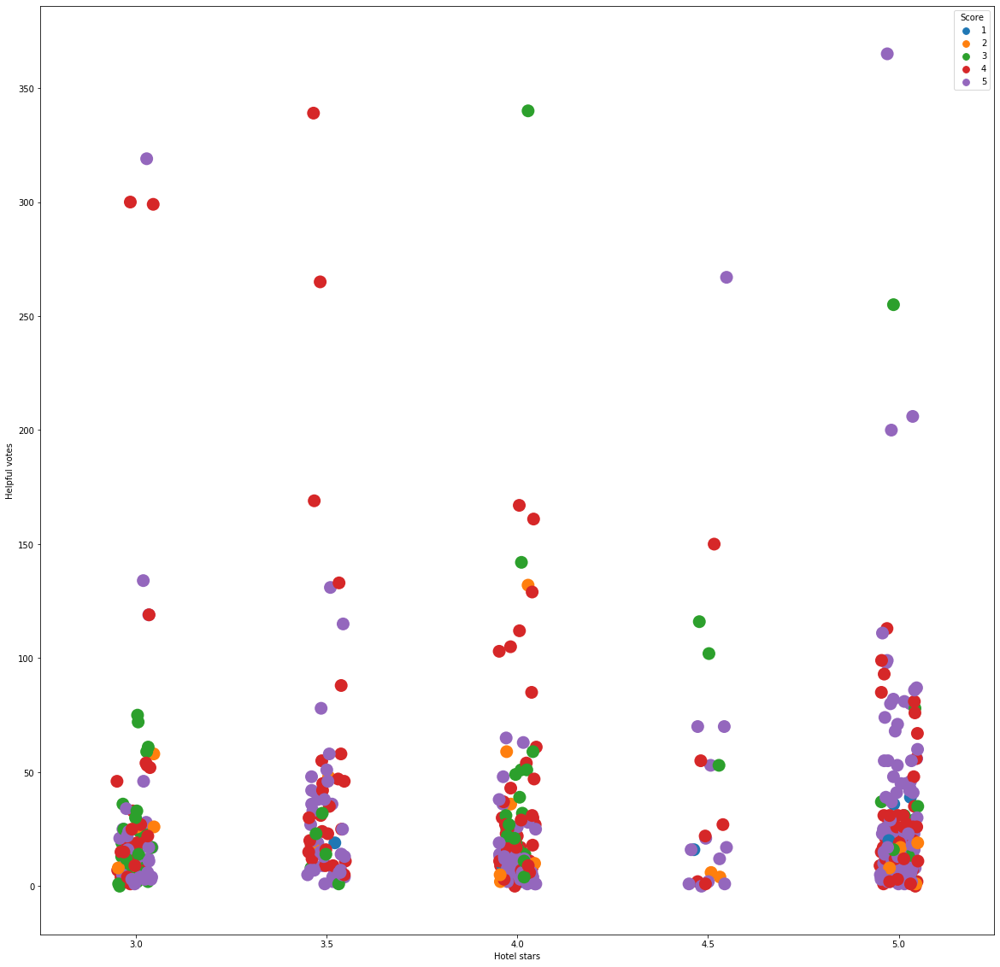

In [77]:
#we got 5 classes of coordinates on the plane
#now we'll visualize it

plt.figure(figsize = (20,20))

sns.stripplot(data=tb, x='Hotel stars', y='Helpful votes', hue='Score', size=15)

#'Hotel stars', 'Nr. rooms','Nr. reviews', 'Nr. hotel reviews', 'Helpful votes'

In [40]:
tb.columns

Index(['User country', 'Nr. reviews', 'Nr. hotel reviews', 'Helpful votes',
       'Score', 'Period of stay', 'Traveler type', 'Pool', 'Gym',
       'Tennis court', 'Spa', 'Casino', 'Free internet', 'Hotel name',
       'Hotel stars', 'Nr. rooms', 'User continent', 'Member years',
       'Review month', 'Review weekday'],
      dtype='object')

/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


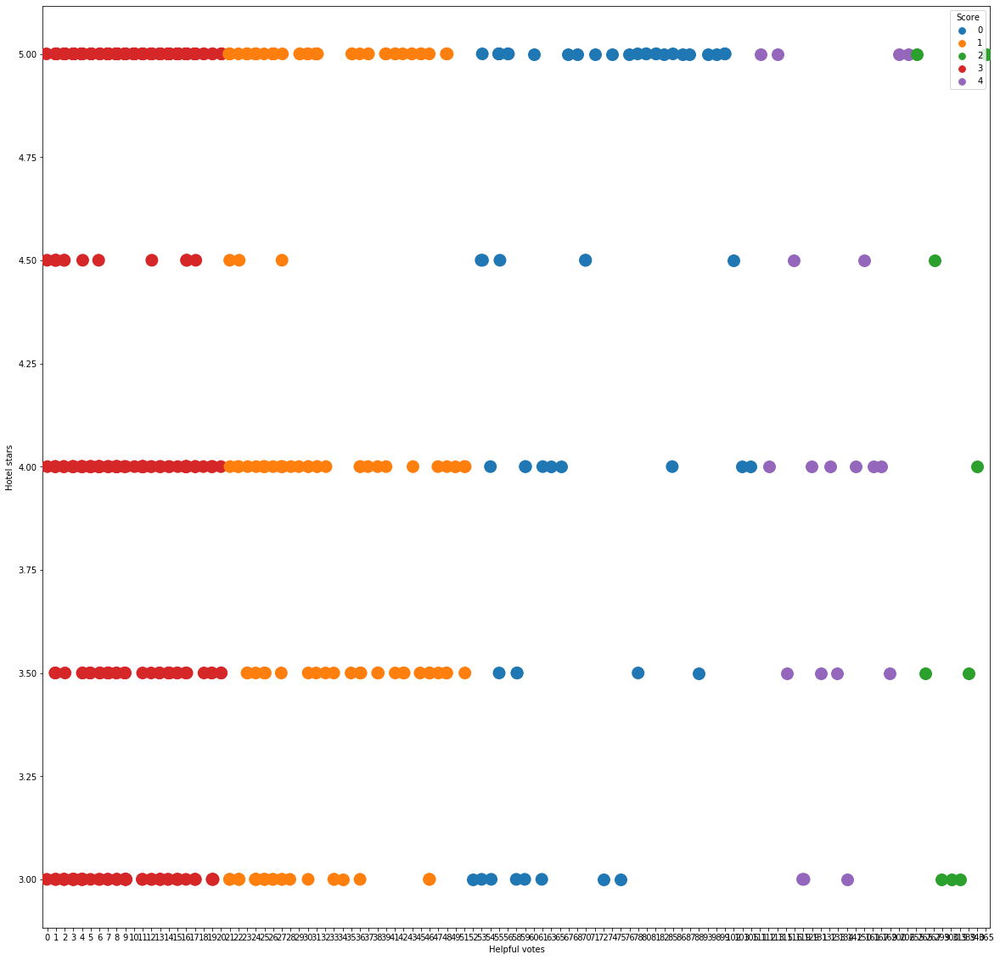

In [78]:
#KMean clustering for identification
from sklearn.cluster import KMeans

tb_clustered = tb[['Hotel stars','Helpful votes']]
kmeans = KMeans(n_clusters=5, random_state=0)
kmeans.fit(tb_clustered)

tb_clustered['Score'] = kmeans.labels_


plt.figure(figsize = (20,20))
sns.stripplot(data=tb_clustered, x='Helpful votes', y='Hotel stars', hue='Score', size=15)


/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


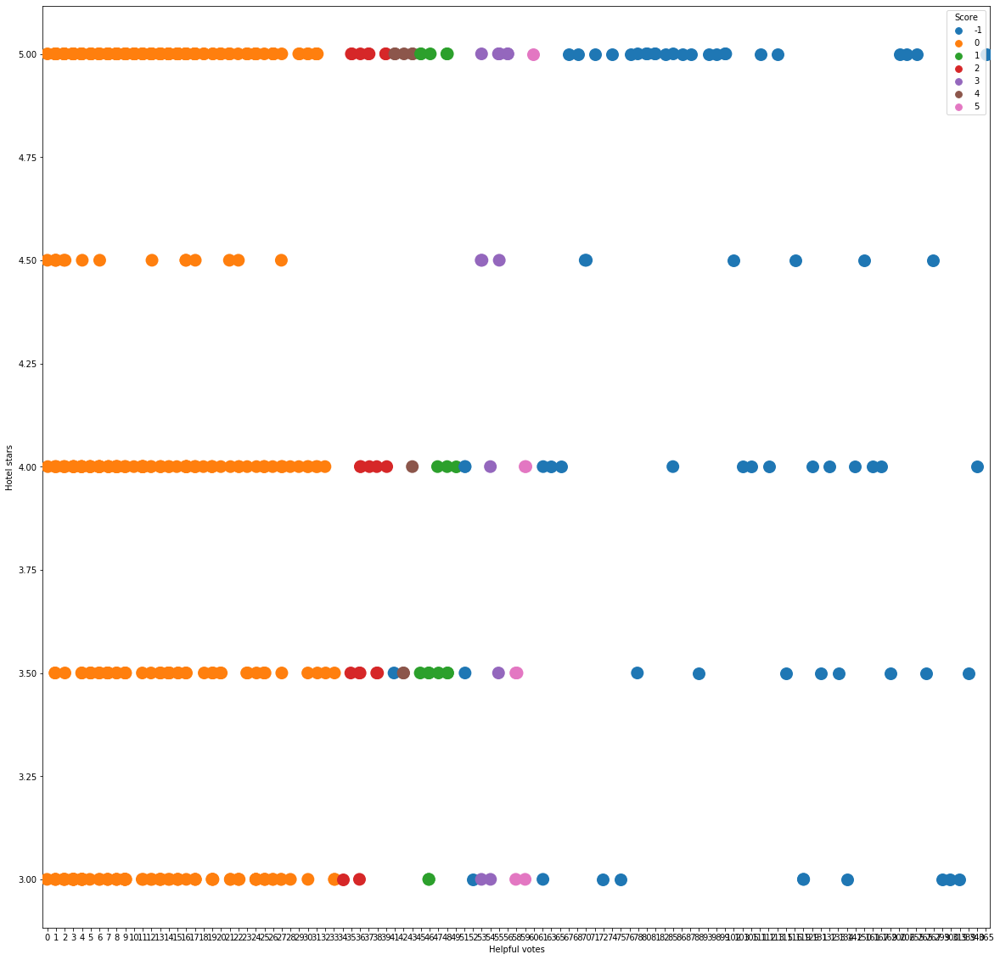

In [15]:
#KMean clustering did a good job for each hotel star, but let's try another method, DBSCAN
from sklearn.cluster import DBSCAN

tb_clustered = tb[['Hotel stars','Helpful votes']]
# The success of dbscan lies in choosing the right epsilon and min_samples values.
# Epsilon tells dscan what is the maximum euclidean distance we allow between neighbours,
# and min_samples tells us how many neighbours are required to accept a point to a class.
# These current settings are not perfect.

dbscan = DBSCAN(eps=1.5, min_samples=7)
dbscan.fit(tb_clustered)

tb_clustered['Score'] = dbscan.labels_

plt.figure(figsize = (20,20))
sns.stripplot(data=tb_clustered,x='Helpful votes', y='Hotel stars', hue='Score', size=15)

/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


CPU times: user 1.21 s, sys: 21.1 ms, total: 1.23 s
Wall time: 1.24 s


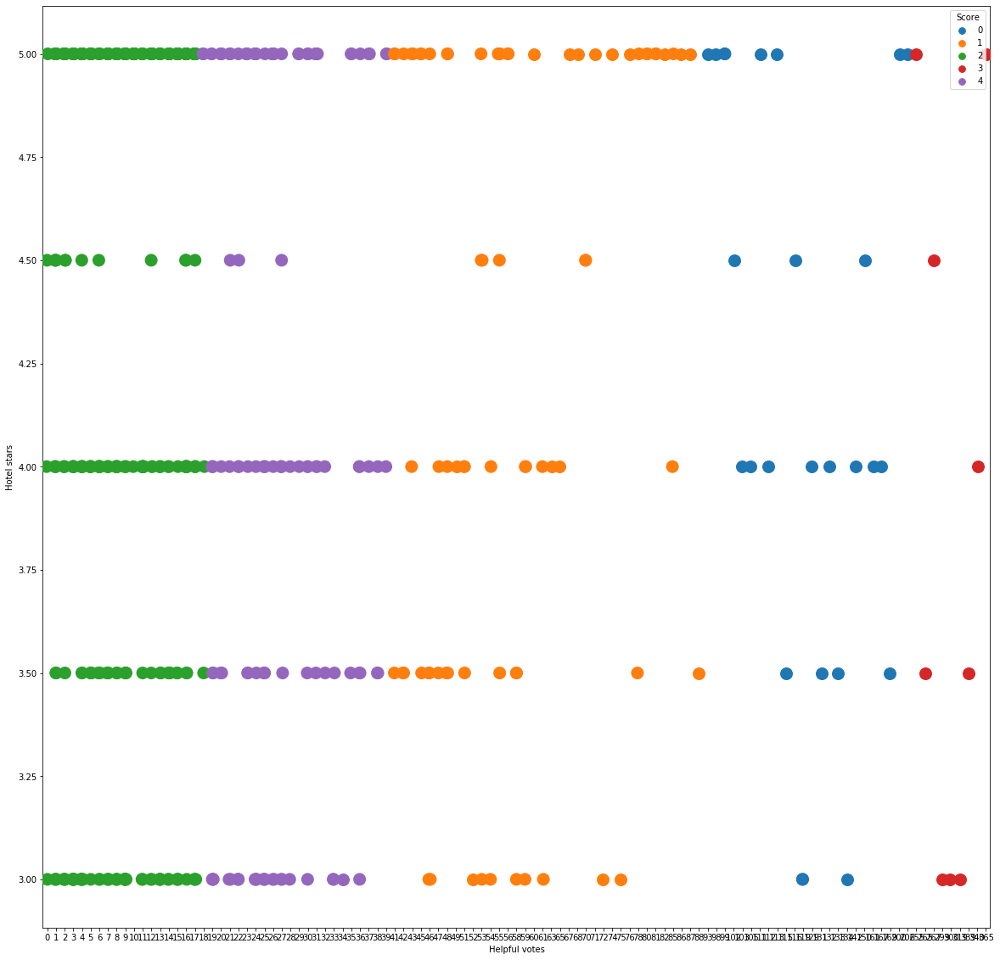

In [88]:
%%time
# Let's take a look at AgglomerativeClustering

from sklearn.cluster import AgglomerativeClustering

tb_clustered = tb[['Hotel stars','Helpful votes']]
agglomerative = AgglomerativeClustering(n_clusters=5)
agglomerative.fit(tb_clustered)

tb_clustered['Score'] = agglomerative.labels_


plt.figure(figsize = (20,20))
sns.stripplot(data=tb_clustered, x='Helpful votes', y='Hotel stars', hue='Score', size=15)
# The problems are the same as with KMeans, but with more consistent results ie. Less random outliers.

In [3]:
#Let's try non-linear model i.e. DecisionTreeClassifier

from sklearn.tree import DecisionTreeClassifier, export_graphviz 
from sklearn import tree
from sklearn.datasets import load_wine
from IPython.display import SVG
from graphviz import Source
from IPython.display import display,Image

In [5]:
# feature matrix
X = tb[['Nr. reviews', 'Nr. hotel reviews', 'Helpful votes', 'Pool', 'Gym',
       'Tennis court', 'Spa', 'Casino', 'Free internet',
       'Hotel stars', 'Nr. rooms',  'Member years']]

# target vector
y = tb[['Score']]

# class labels
labels = ['Nr. reviews', 'Nr. hotel reviews', 'Helpful votes', 'Pool', 'Gym',
       'Tennis court', 'Spa', 'Casino', 'Free internet',
       'Hotel stars', 'Nr. rooms',  'Member years']

# print dataset description
estimator = DecisionTreeClassifier()
estimator.fit(X, y)

graph = Source(tree.export_graphviz(estimator, out_file='tree.dot', feature_names=labels,filled = True))

# Convert to png using system command (requires Graphviz)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display the tree we got

Image(filename = 'tree.png')

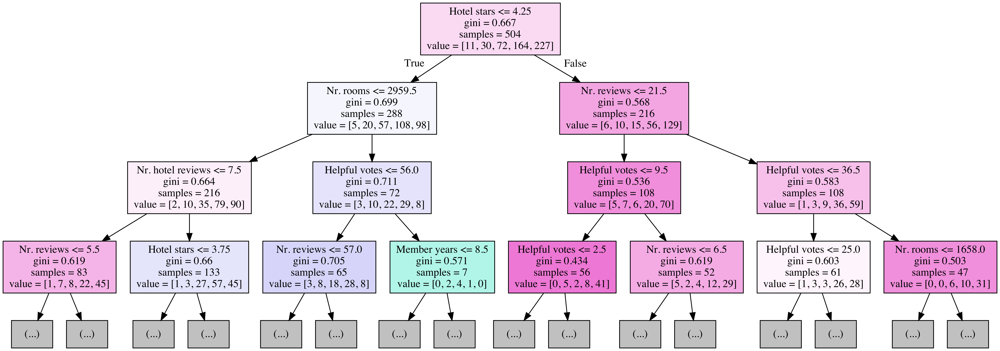

In [6]:
#We can't really see what is in it so let's fix the depth of the tree

graph = Source(tree.export_graphviz(estimator, out_file='tree.dot', feature_names=labels,filled = True,max_depth = 3))

call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# And again display the new tree 

Image(filename = 'tree.png')

In [4]:
#Now it is visible much better

In [7]:
#The very last method - Random forest

from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(max_depth=5, random_state=0)
clf.fit(X, y)

/Users/vitalij/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=5, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [11]:
#Using KNN for score prediction

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X, y) 
knn.score(X_test, y_test),clf.score(X_test, y_test)

/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  


(0.556930693069307, 0.594059405940594)

In [12]:
#Random Forest gave better score than KNN on test data

p = (list(clf.predict(X_test)))
len(p)

404

In [17]:
Predictions = X_test
Predictions['Original_Score']= y
Predictions['pred_score'] = p
Predictions.head()

/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/vitalij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Hotel stars,Nr. rooms,Nr. reviews,Nr. hotel reviews,Helpful votes,Original_Score,pred_score
18,3.0,3773,41,9,19,3,4
306,3.5,1228,11,3,16,2,5
104,4.0,1467,8,4,0,4,5
4,3.0,3773,5,5,2,4,4
156,5.0,2959,6,4,14,1,5


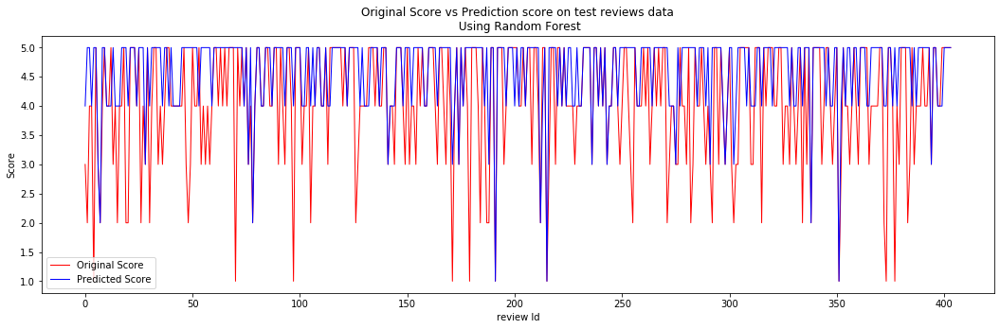

In [18]:
plt.figure(figsize=(18, 5))
ax = plt.subplot()
d = list(range(0,len(Predictions)))

#plotting original score
p1 = plt.plot(d,Predictions['Original_Score'],'r-', label="Original Score", linewidth= 1 )

#plotting predicted score
p2 = plt.plot(d,Predictions['pred_score'],'b-', label="Predicted Score", linewidth= 1)

ax.set_title('Original Score vs Prediction score on test reviews data\n Using Random Forest')
ax.set_xlabel('review Id')
ax.set_ylabel('Score')
ax.legend(handles, labels)

handles, labels = ax.get_legend_handles_labels()

plt.show()